# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 45

**Author 1 (sciper):** Elias William (367106)  
**Author 2 (sciper):** Erik Kvikne (xxxxx)   
**Author 3 (sciper):** Sami Laubo (360965)   

**Release date:** 8.03.2023  
**Due date:** 24.03.2022 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class well as
preparation for the final project, which is a practical project which ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

We will not rerun the notebook for you.

[iapr]: https://github.com/LTS5/iapr

---
## 0. Extract relevant data
We first need to extract the `lab-01-data.tar.gz` archive.
To this end, we use the [tarfile] module from the Python standard library.

[tarfile]: https://docs.python.org/3.6/library/tarfile.html

In [4]:
import tarfile
import os

data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')

if not os.path.exists(tar_path):
    raise Exception('Path to is not valid {}'.format(tar_path))
    
with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)

..\data


---
## Part 1: Segmentation


### 1.0 Intro

In this exercise, you will be given two images. 

* `mucinous_adeno.jpg`: The image depicts a tissue sample from mucinous adenocarcinoma in colorectal cancer. The data is taken from the Cancer Genome Atlas (TCGA) which is an open-source database of different cancer types. Here you can see a tissue taken from a patient and stained using hematoxylin (purple) and eosin (pink) staining. The hematoxylin stains cell nuclei with a purplish blue, and the eosin stains the extracellular matrix and cytoplasm in pink.

* `mucinous_adeno_gt.jpg`: The second image is a coarse annotation of what is regarded as the so-called mucinous area. The mucinous area can be identified as a gray area tainted with purple. The presence of a large amount of mucin is a sign of a defect of normal epithelial cells that start to produce an unreasonable amount of mucin.


### 1.1 Tasks

You will be asked to extract the mucinous area using various approaches:

- [ ] Thresholding
- [ ] Morphology
- [ ] Region growing


### 1.1 Brain image visualization

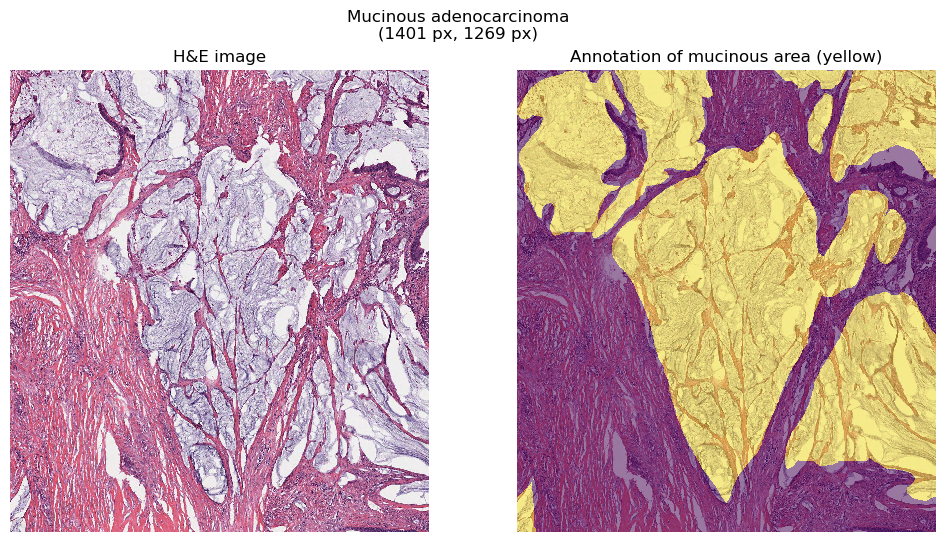

In [5]:
import skimage.io
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load images
path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
path_to_gt = os.path.join(data_base_path, data_folder, "mucinous_adeno_gt.jpg")
adeno_img = skimage.io.imread(path_to_image)
adeno_gt = skimage.io.imread(path_to_gt) > 128

# Get size of the image in px
im_h, im_w, im_c = adeno_img.shape

# Display MRI image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

# Plot image with overlay
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')
plt.suptitle("Mucinous adenocarcinoma\n({} px, {} px)".format(im_h, im_w))
plt.show()

---
### 1.2 Thresholding (4pts)
#### 1.2.1 RGB & Hue (1 pts)

Display the histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel. Note that you can use [rgb2hsv](https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2hsv) to convert an RGB image to an HSV image and then extract the hue.

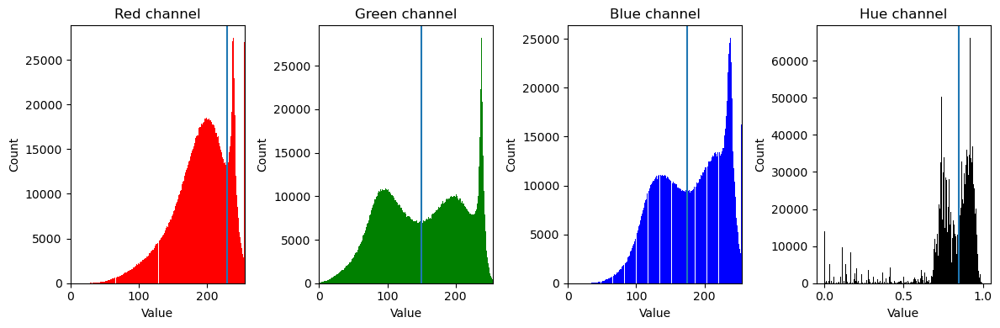

In [3]:
fig, axes = plt.subplots(1, 4, figsize=(12, 4))

# RGB Histograms
titles = ['Red channel', 'Green channel', 'Blue channel']
colors = ['red', 'green', 'blue']
thresh = [230, 150, 175, 0.85]

for idx, (ax, title, color) in enumerate(zip(axes[:3], titles, colors)):
    ax.hist(adeno_img[:, :, idx].ravel(), bins=255, color=color)
    ax.axvline(thresh[idx])
    ax.set_title(title)
    ax.set_xlim((0, 255))
    ax.set_xlabel('Value')
    ax.set_ylabel('Count')

# Hue histogram
hue_image = np.array(skimage.color.rgb2hsv(adeno_img))
axes[3].hist(hue_image[:, :, 0].ravel(), bins=255, color='k')
axes[3].set_title('Hue channel')
axes[3].axvline(thresh[3])
axes[3].set_xlabel('Value')
axes[3].set_ylabel('Count')

plt.tight_layout()
plt.show()



#### 1.2.2 Apply Thresholding (2 pts)

For each histogram find the threshold(s) that work the best to isolate the mucinous area. Display the image after thresholding of each channel as well as the error between your prediction ($im$) and the annotations ($gt$) using the formula:

$$error = 1 - \left( \frac{1}{IJ} \sum_{i,j} im_{i,j} == gt_{i, j} \right)$$

Here, I and J are the dimension of the image.

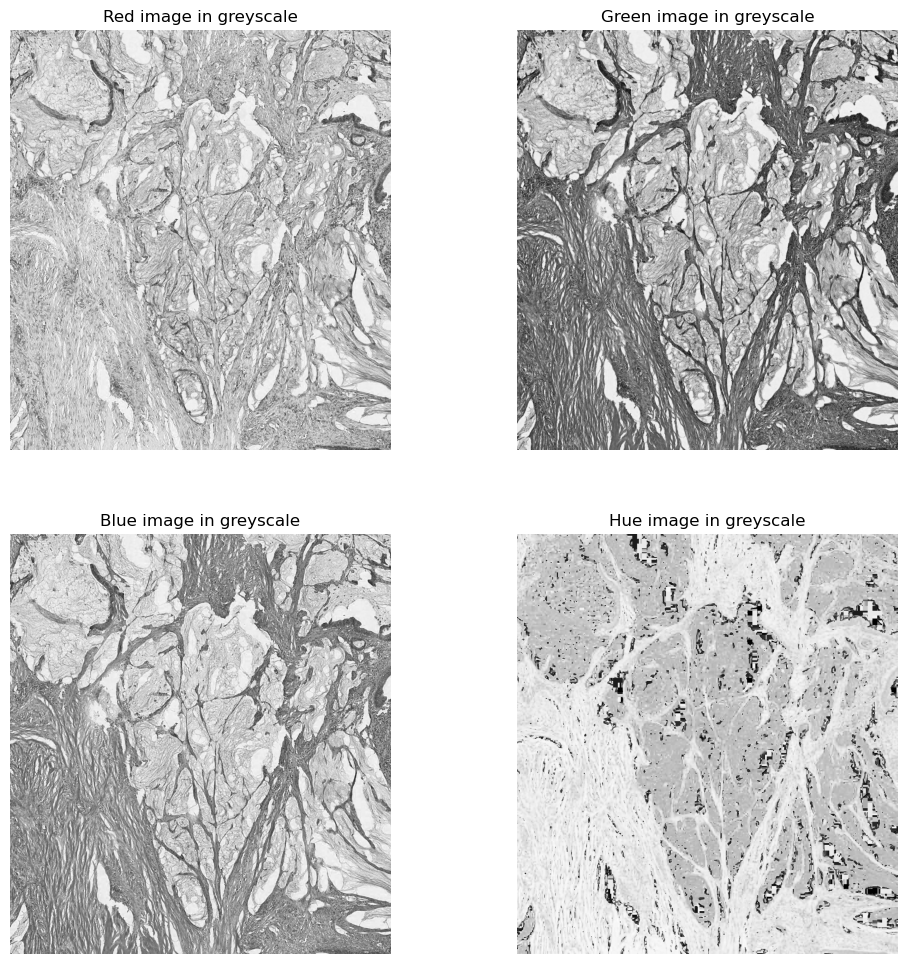

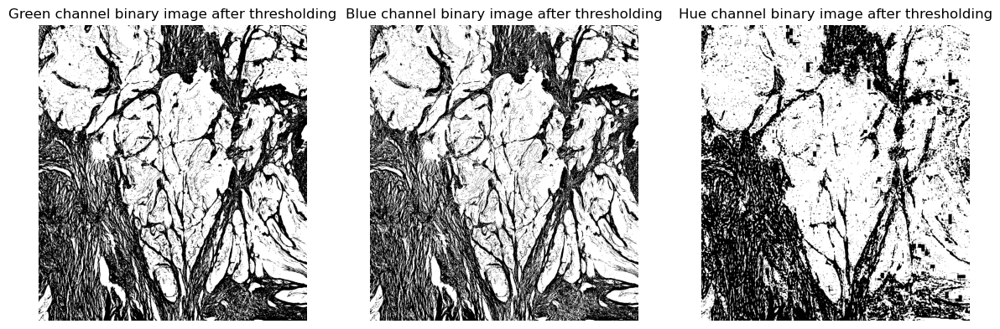

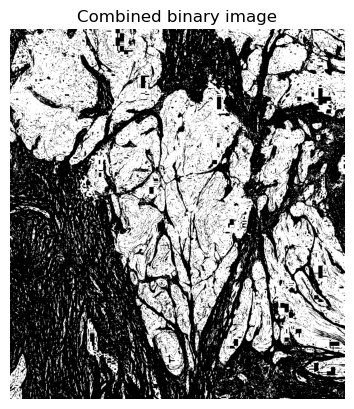

Combined binary image error: 0.22381401554332747


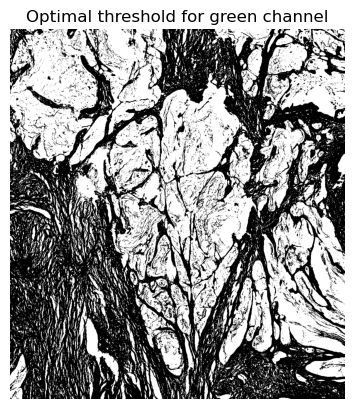

Optimal threshold error: 0.26312849821893525


In [5]:
# Images defintions
adeno_red = adeno_img[:,:,0]
adeno_green = adeno_img[:,:,1]
adeno_blue = adeno_img[:,:,2]
adeno_hue = skimage.color.rgb2hsv(adeno_img)[:,:,0]

# Plot the channels by them self in greyscale
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0,0].imshow(adeno_red, cmap='gray')
ax[0,0].set_title('Red image in greyscale')
ax[0,0].axis('Off')

ax[0,1].imshow(adeno_green, cmap='gray')
ax[0,1].set_title('Green image in greyscale')
ax[0,1].axis('Off')

ax[1,0].imshow(adeno_blue, cmap='gray')
ax[1,0].set_title('Blue image in greyscale')
ax[1,0].axis('Off')

ax[1,1].imshow(adeno_hue, cmap='gray')
ax[1,1].set_title('Hue image in greyscale')
ax[1,1].axis('Off')


plt.show()

# Green channel threshold from visual interpretation of the histogram
binary_green = adeno_green > 135

# Blue channel threshold from visual interpretation of the histogram
binary_blue = adeno_blue > 165

# Hue channel threshold from visual interpretation of the histogram
binary_hue = adeno_hue < 0.88

# Plot the individual binary images
titles = ( 'Green channel binary image after thresholding',
          'Blue channel binary image after thresholding',
          'Hue channel binary image after thresholding')
images = (binary_green, binary_blue, binary_hue)

fig, axs = plt.subplots(1,3, figsize = (12, 4))

for idx, (ax, title, image) in enumerate(zip(axs, titles, images)):
    ax.imshow(image, cmap='gray')
    ax.set_title(title)
    ax.axis('Off')
plt.tight_layout()
plt.show()

# Combine the images

binary_all = (binary_green &
             binary_blue &
             binary_hue)
plt.figure()
plt.imshow(binary_all, cmap='gray')
plt.title('Combined binary image')
plt.axis('Off')
plt.show()

# Calculate error
def calc_error(img):
    I = img.shape[0]
    J = img.shape[1]
    error = 1 - (1/(I*J) * np.sum(img == adeno_gt))

    return error

print(f'Combined binary image error: {calc_error(binary_all)}')

# With optimal threshold for the Green channel
thres = skimage.filters.threshold_otsu(adeno_green)
binary_opt = adeno_green > thres

plt.figure()
plt.imshow(binary_opt, cmap='gray')
plt.title('Optimal threshold for green channel')
plt.axis('Off')
plt.show()

print(f'Optimal threshold error: {calc_error(binary_opt)}')

#### 1.2.3 Best Thresholding (1 pts)

Based on your previous findings, set the best threshold(s) and create the final mask as the variable `mask_thesholding`

In [6]:
# TODO: replace variabel with your own threshod
mask_thesholding = binary_all

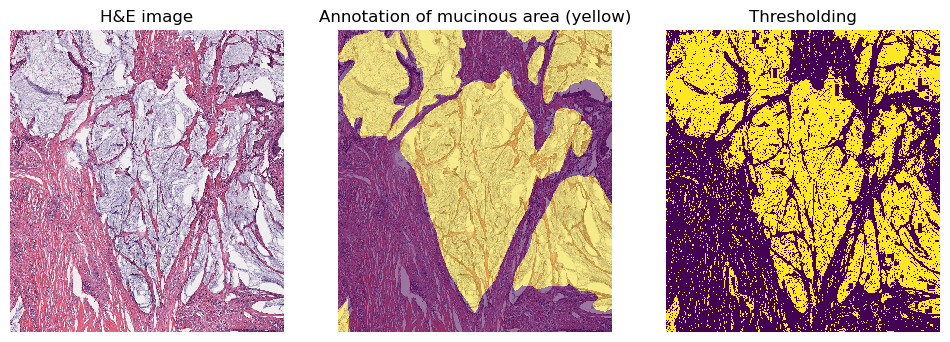

In [7]:
# Display MRI image
fig, ax = plt.subplots(1, 3, figsize=(12, 5))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(mask_thesholding, interpolation='nearest')
ax[2].imshow(mask_thesholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Thresholding')
ax[2].axis('off')

plt.show()

---

### 1.3 Morphology (5pts)

To proceed, use the best results of the previous model (namely `mask_thesholding`) as the starting point. In this exercise we will try to clean the mask using morphology.

* A (2pts): Try the following operation [closing](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing), [opening](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) with [disk](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) size of: $1, 2, 5, 10$. Comment on the quality of the results.

* B (2pts): Try the following operation [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) with size of: $10, 50, 100, 500$. Comment on the quality of the results.

* C (1pts): Based on your previous results, can you find a combination of the functions that improve your results? Plot the best result along with the error rate. Save the mask as the variable `mask_morph`

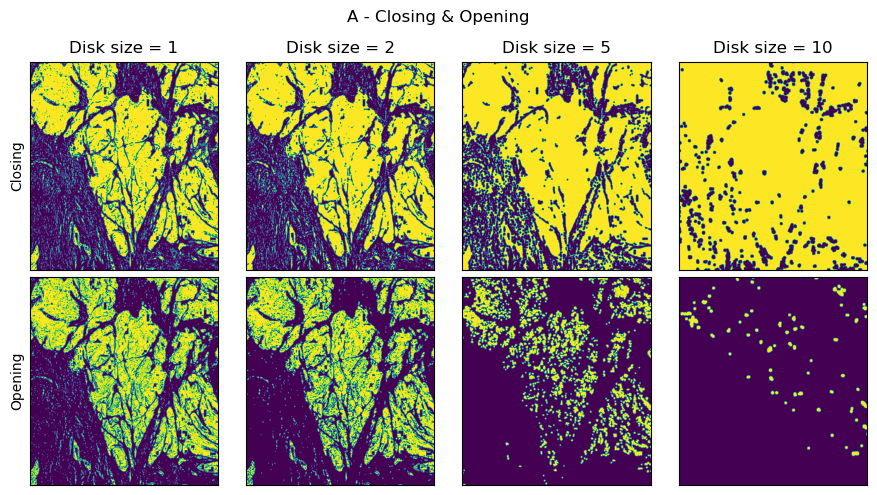

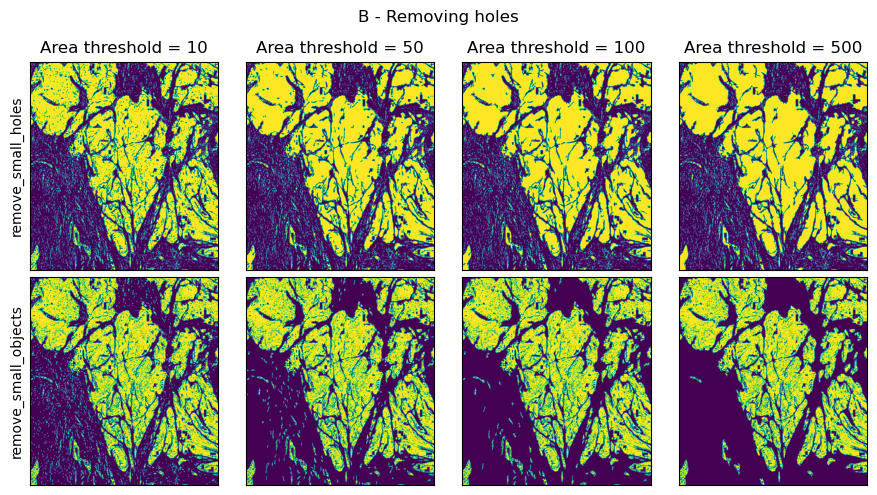

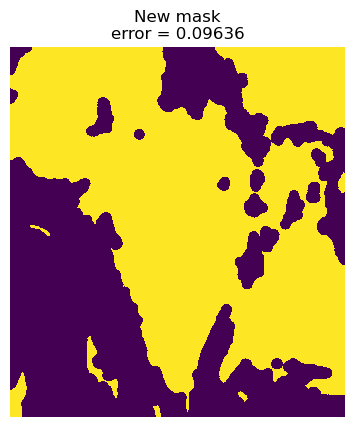

In [8]:
from skimage.morphology import closing, opening, disk, remove_small_holes, remove_small_objects

mask_morph = np.zeros_like(adeno_gt)

# Original start
# plt.figure()
# plt.imshow(mask_thesholding, interpolation='nearest')
# plt.title('Thresholding')
# plt.axis('off')
# plt.show()

# A: Opening and closing
fig, axs = plt.subplots(2, 4, figsize=(9, 5))
fig.suptitle('A - Closing & Opening')

for idx, disk_size in enumerate([1, 2, 5, 10]):
    axs[0, idx].imshow(closing(mask_thesholding, disk(disk_size))) # Closing function with disk size
    axs[1, idx].imshow(opening(mask_thesholding, disk(disk_size))) # Opening function with disk size

    axs[0, idx].set_title(f'Disk size = {disk_size}')

# Fix up plot
for ax in axs.ravel():
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.set_xticks([])
    ax.set_yticks([])

axs[0, 0].set_ylabel('Closing')
axs[1, 0].set_ylabel('Opening')

plt.tight_layout()
plt.show()


# B: Removing holes
fig, axs = plt.subplots(2, 4, figsize=(9, 5))
fig.suptitle('B - Removing holes')

for idx, area in enumerate([10, 50, 100, 500]):
    axs[0, idx].imshow(remove_small_holes(mask_thesholding, area))
    axs[1, idx].imshow(remove_small_objects(mask_thesholding, area))

    axs[0, idx].set_title(f'Area threshold = {area}')

# Fix up plot
for ax in axs.ravel():
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.set_xticks([])
    ax.set_yticks([])

axs[0, 0].set_ylabel('remove_small_holes')
axs[1, 0].set_ylabel('remove_small_objects')

plt.tight_layout()
plt.show()

# C: Improve result
mask_morph = mask_thesholding
mask_morph = remove_small_objects(mask_morph, 500)
mask_morph = remove_small_holes(mask_morph, 500)
mask_morph = closing(mask_morph, disk(20))

plt.figure()
plt.imshow(mask_morph, interpolation='nearest')
plt.title(f'New mask\nerror = {calc_error(mask_morph):.5f}')
plt.axis('off')
plt.show()

---
### 1.4 Region growing (5pts)

In this exercise you will implement from scratch your own region growing algorithm. Choose one of the image channel (R/G/B/H) as the source image. You can use multiple seed point to achieve better results. Plot the best result along with the error rate. Save the mask as the variable `mask_region`.

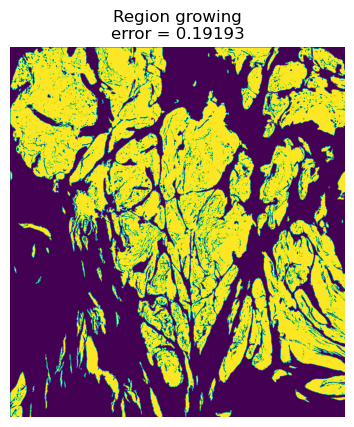

In [10]:
from collections import deque
from random import sample

mask_region = np.zeros_like(adeno_gt)

def region_growing(img_inpt):
    pixel_threshold = 135
    img = img_inpt.copy()

    # For green mask (from histogram: choose brightest pixels)
    # Map to set of tuples instead of numpy array: {(0, 4), (1, 0), (1, 1), ...}
    start_indices = set(map(tuple, np.argwhere(img > 220)))

    # Image with all regions
    region_img = np.zeros_like(img).astype(bool)

    # Create queue to check surrounding pixels
    pixel_queue = deque()

    # Function to check surrounding pixels and add to queue
    def check_surrounding_pixels(x, y):
        surrounding_coordinates = [(x+1, y), (x-1, y), (x, y+1), (x, y-1)]

        for (x, y) in surrounding_coordinates:
            if 0 < x < img.shape[0] and 0 < y < img.shape[1]:               # If inside image
                if not region_img[x, y] and ((x, y) not in pixel_queue):    # If not checked before or queued
                    if img[x, y] > pixel_threshold:                         # If pixel is above threshold value
                        region_img[x, y] = 1        # Add to region
                        pixel_queue.append((x, y))  # Add to queue

    # Seed from 40 places
    for _ in range(100):
        # Remove mapped regions from possible start indices
        start_indices = start_indices - set(map(tuple, np.argwhere(region_img == 1)))
        if len(start_indices) == 0:
            print('No more start seeds')
            break

        # Choose random start seed
        # pixel_queue.append(start_indices[np.random.randint(start_indices.shape[0])])
        # pixel_queue.append(sample(start_indices, 1)[0])
        pixel_queue.append(start_indices.pop())

        # Check while queue is not empty
        while len(pixel_queue):
            x, y = pixel_queue.popleft()

            check_surrounding_pixels(x, y)

    return region_img
    

mask_region = region_growing(adeno_green)
plt.figure()
plt.title(f'Region growing\nerror = {calc_error(mask_region):.5f}')
plt.axis('off')
plt.imshow(mask_region)
plt.show()

---
### 1.5 Method comparison (1pt)

In this section we display the overall outputs. Please make sure that you create the variables `mask_thesholding`, `mask_morph`, and `mask_region` to properly display the output. Comment on the results and what you think would be the best approach.

In [11]:
# Traditional thresholding can be a good technique for images if you know the area you are intressted in is in another intensity
# level than the background. For example the red image was worthless as the foreground had the same intensity as the background.
# Also we found that the combination of the threshold for multiple channels with 'optimistic' thresholds worked better than 
# the optimal threshold for one channel.
# The threshold method is a good first step but also very receptable to noice. Thats where we can start using morphology or region growing
# to try to reduce the affect of noise. We think that a good apporach is first to threshold and then to use a smart combination
# of the morphology techniques to create a binary image.

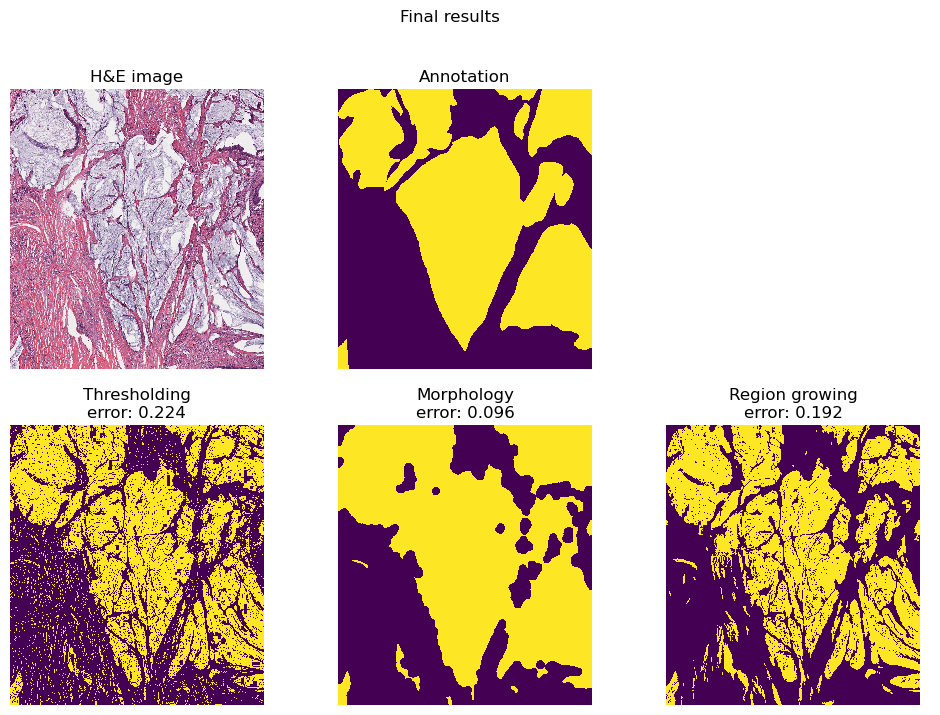

In [12]:
error_th = 1- (mask_thesholding == adeno_gt).mean()
error_morph = 1- (mask_morph == adeno_gt).mean()
error_region = 1- (mask_region == adeno_gt).mean()


# Display MRI image
fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# Plot image
ax[0, 0].imshow(adeno_img, interpolation='nearest')
ax[0, 0].set_title('H&E image'.format(im_h, im_w))

# Plot image with overlay
ax[0, 1].imshow(adeno_gt, interpolation='nearest')
ax[0, 1].set_title('Annotation')

# Plot estimation using thresholding
ax[1, 0].imshow(mask_thesholding, interpolation='nearest')
ax[1, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))

# Plot estimation using Contour detection
ax[1, 1].imshow(mask_morph, interpolation='nearest')
ax[1, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))


# Plot estimation using Region growing
ax[1, 2].imshow(mask_region, interpolation='nearest')
ax[1, 2].set_title('Region growing\nerror: {:.3f}'.format(error_region))


[a.axis('off') for a in ax.ravel()]


plt.suptitle("Final results")
plt.show()

# ---
## Part 2: Axon segmentations (10 points)

#### Intro 

Axon segmentation is vital to neuroscience research as it enables the study of neurons' morphology and connectivity. We will conduct two exercises to evaluate the impact of your segmentation algorithms under different independent artefacts. Each exercise consists of a synthetic **Ground Truth (GT)** and two more images simulating a specific artifact.

The **Ground Truth**  has tree main compartments. 1) The inner part of the axon. 2) The outer layer of the axon (called myelin) and the extracellular slace (the background of the image). 

The task consists into segmenting the three main compartments in the image to compute the inner-axon and outer-axon radii distribution.


To compute the radii, we suggest the following approximation.
$$\hat{r}_{I}= \sqrt{\frac{A_{yellow}}{\pi}}$$
$$\hat{r}_{O}= \sqrt{\frac{A_{yellow} + A_{blue}}{\pi}}$$
Where **A** is the corresponding area of the comparments. 
**Using this image as reference** 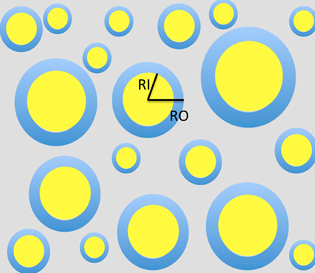

#### Artifacts simulated:

Excercise 1) Two images with different levels of SNR (signal to noise ratio). The images have rician noise.
Exercise  2) Two images adquired using a fraction of the fourier space. Only Lowest frequency are used to reconstruct the image. (simulating fast aquisitions in MRI)

Ensure your algorithm works on the GT before you go to the test cases with artifacts. Apply any preprocessing needed to the image. The preprocessing can be different for each type of image.

### Tasks

For each exercise we ask to:

1) Segment the images with the following colors: blue the inner part of the axon, red the outer part of the axon (myelin) and white for the backround(example) 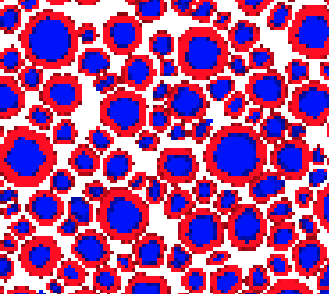

2) Count the number of axons obtained in the sample, calculate the radii for each axons, and display a radii histogram for the each of the images(GT and test cases).

In the exercises, assume that each pixel side is $(0.1 \mu m)$, i.e. a pixel has an area of $(0.01 \mu m^2 )$

## Grading 
The answers does not have to be perfect, they just be a good approximation.

1. Developing an algorithm that works for the two GT images. **(3 points)** 
2. Use preprosesing to prepare the images with SNR and the Low frequencies.  (**1 point** for SNR preprocesing , **1 point** for Low-frequency images preprocesing)
3. Running the algorithm in the test images. **1/2 point** SNR, **1/2 point** Low freqs
4. Computing and plotting radii distributions **(1 point)**
5. Explaining and discussing your implementation. **(3 points )**
    Try to be specific, not necessarily long. In the discussion include:
 1. What worked? 
 2. What did not work?
 3. Why do you think it does not work? 
 4. How could you improve your algorithms as future work?  Try to avoid general comments like "using deep learning" 
 
**Extra points: Real data example (3 points), the algorithm should display a _good enough_ segmentation.**

### 2.1 SNR

In [6]:
data_base_path

'..\\data'

..\data


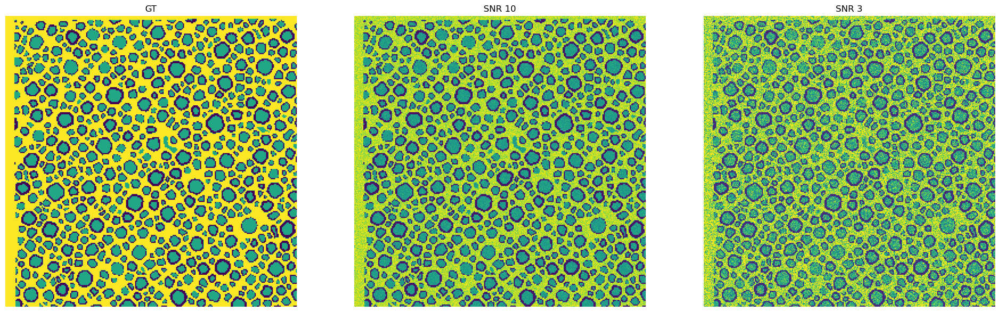

In [7]:
from PIL import Image
import matplotlib.pyplot as plt
import cv2

data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/' 

files = ["GT_0.png"  , "test_0_0.png" , "test_0_1.png"]
gt_0 = np.array(Image.open(path_folder+ files[0]))
snr_10 = np.array(Image.open(path_folder+ files[1]))
snr_3 = np.array(Image.open(path_folder+ files[2]))

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])#, cmap ='gray')
    ax.axis('off')

    ax.set_title(nm)
plt.show()

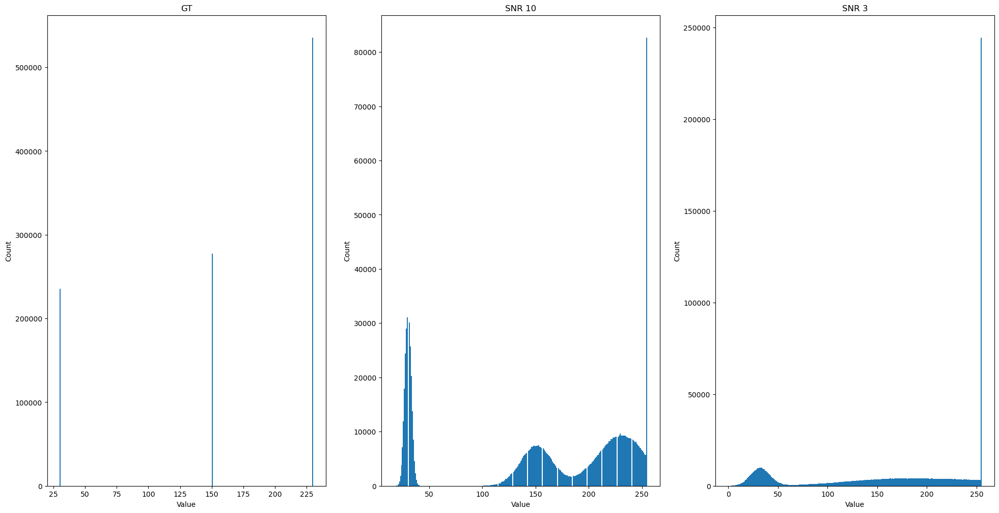

In [8]:
#Just wantet to see the distribution of "colour"

fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.hist(np.ravel(im), bins=255)
    ax.set_title(nm)
    ax.set_xlabel('Value')
    ax.set_ylabel('Count')
plt.show()


### 2.1.1 Preprocessing 

 % add your images after preprocessing


In [9]:
from skimage.restoration import denoise_nl_means, estimate_sigma, denoise_tv_chambolle

sigma_est_10 = np.mean(estimate_sigma(snr_10)) # Estmating the variance of the picture as it is used in the denoising

patch_kw = dict(patch_size=2,      # 2x2 patches
                patch_distance=4)#,  # 4x4 search area)

# slow algorithm
denoise_10 = denoise_nl_means(snr_10, h=2.00 * sigma_est_10, fast_mode=False,**patch_kw, preserve_range=True) #
# denoise_10 = denoise_tv_chambolle(snr_10, channel_axis = -1)

# The parameters for denoising snr_10 are pretty well optimized, but there is still some work to be done to make snr_3 look better:

sigma_est_3 = np.mean(estimate_sigma(snr_3)) # Estmating the variance of the picture as it is used in the denoising

# Tuning these paramameters might result in a better image
patch_kw = dict(patch_size=4,      # 4x4 patches
                patch_distance=2)#,  # 2x2 search area)

# slow algorithm
denoise_3 = denoise_nl_means(snr_3, h=2.00 * sigma_est_3, fast_mode=False,**patch_kw, preserve_range=True) # Tuning the number multiplied with sigma_est_3 might give better image
# denoise_3 = denoise_tv_chambolle(snr_3, channel_axis = -1)


### 2.1.2 Results Segmetations

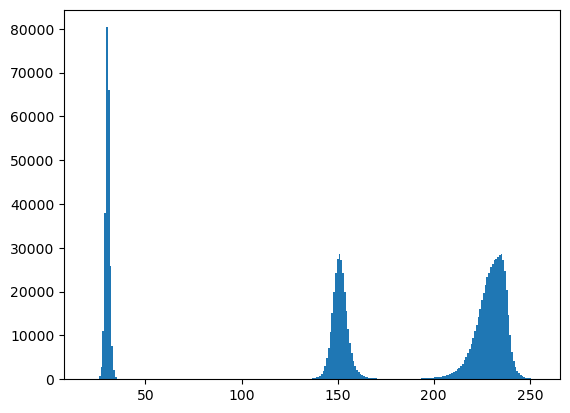

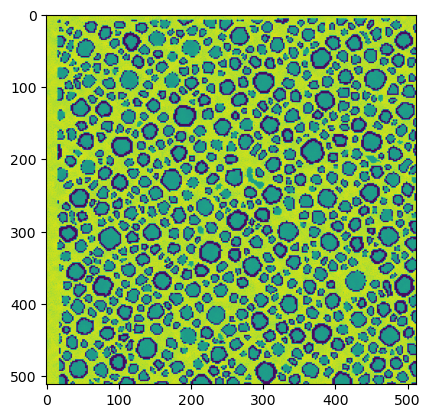

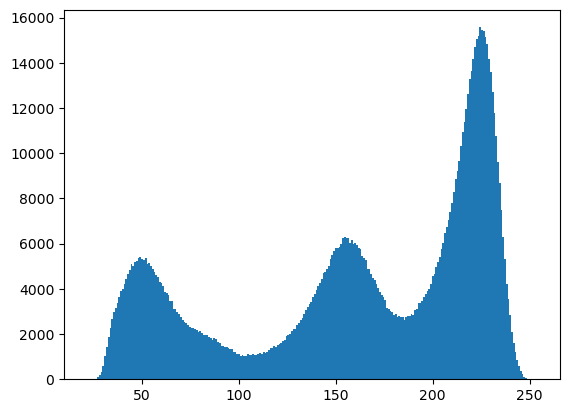

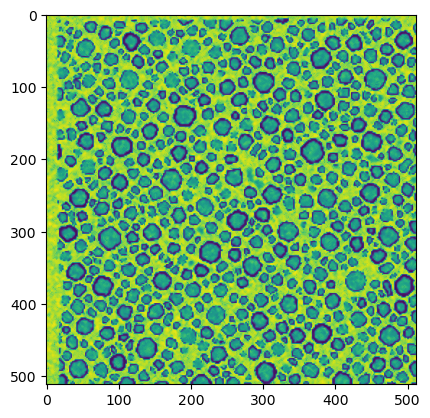

In [10]:
plt.hist(denoise_10.ravel(), bins=256)
plt.show()
plt.imshow(denoise_10[0:512,0:512])
plt.show()

plt.hist(denoise_3.ravel(), bins=256)
plt.show()
plt.imshow(denoise_3[0:512,0:512])
plt.show()

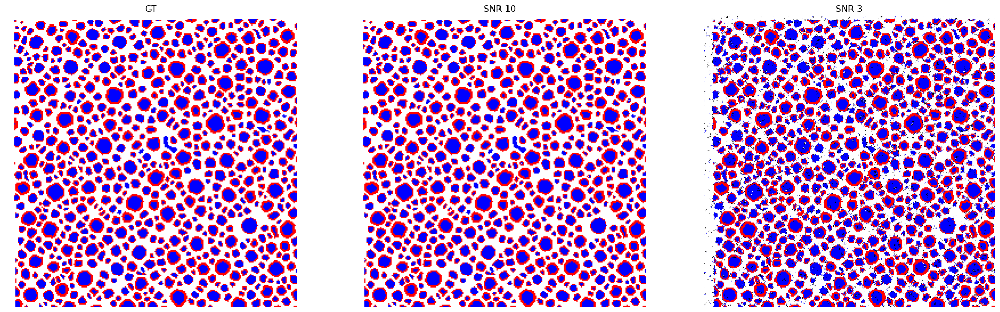

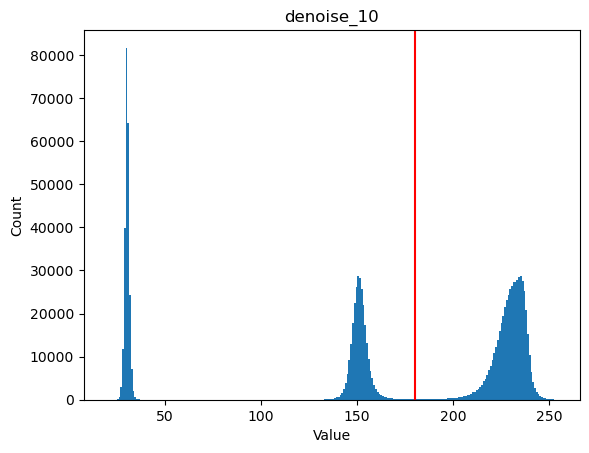

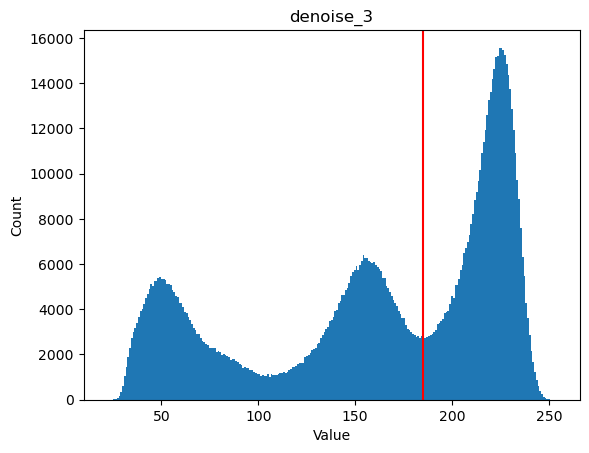

 710 wrong pixels out of 1048576: 0.067711 %
 88612 wrong pixels out of 1048576: 8.450699 %


In [11]:
import scipy



GTSegmented = np.zeros((1024,1024,3)) # New valuable for RGB image of GT 
snr10seg = np.zeros((1024,1024,3)) # New valuable for RGB image of snr_10
snr3seg = np.zeros((1024,1024,3)) # New valuable for RGB image of snr_3


# Changing the pixels with different intensity to red blue and white
GTSegmented[gt_0==30] = np.array([255,0,0])
GTSegmented[gt_0==150] = np.array([0,0,255])
GTSegmented[gt_0==230] = np.array([255,255,255])
GTSegmented=GTSegmented.astype('uint8') # Got some error when I plotted, this fixed it

# Segmenting snr_10 photo
snr10seg[denoise_10 < 80] = np.array([255,0,0])
snr10seg[(denoise_10 >= 80) & (denoise_10 < 180)] = np.array([0,0,255])
snr10seg[denoise_10 >= 180] = np.array([255,255,255])
snr10seg=snr10seg.astype('uint8') # Got some error when I plotted, this fixed it

# Segmenting snr_3 photo
snr3seg[denoise_3 < 90] = np.array([255,0,0])
snr3seg[(denoise_3 >= 90) & (denoise_3 < 180)] = np.array([0,0,255])
snr3seg[denoise_3 >= 190] = np.array([255,255,255])
snr3seg=snr3seg.astype('uint8') # Got some error when I plotted, this fixed it


#images = [gt_0 , snr_10, snr_3]
images = [GTSegmented , snr10seg, snr3seg] # New names for photos
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512], cmap='gray')
    ax.axis('off')
    ax.set_title(nm)
plt.show()

# Plot of intensities. Used to compare with plots from before denoising, and to determine cut-off values for different colors.

plt.hist(np.ravel(denoise_10), bins=255)
plt.axvline(180, c='r')
plt.title('denoise_10')
plt.xlabel('Value')
plt.ylabel('Count')
plt.show()

plt.hist(np.ravel(denoise_3), bins=255)
plt.axvline(185, c='r')
plt.title('denoise_3')
plt.xlabel('Value')
plt.ylabel('Count')
plt.show()


# Shows how good the denoising is by counting amount of pixels that are different from the ground truth

#snr10
wrongPixels10 = sum([any(x) for x in snr10seg.reshape((1024*1024,3)) != GTSegmented.reshape((1024*1024,3))])
print(f' {wrongPixels10} wrong pixels out of {1024*1024}: {round(wrongPixels10/(1024*1024)*100 ,6)} %')

#snr3
wrongPixels3 = sum([any(x) for x in snr3seg.reshape((1024*1024,3)) != GTSegmented.reshape((1024*1024,3))])
print(f' {wrongPixels3} wrong pixels out of {1024*1024}: {round(wrongPixels3/(1024*1024)*100 ,6)} %')



### 2.1.3 Radii histrograms 

In [12]:
from skimage.measure import label, regionprops, regionprops_table

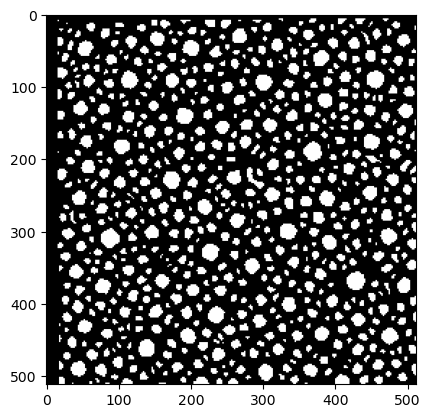

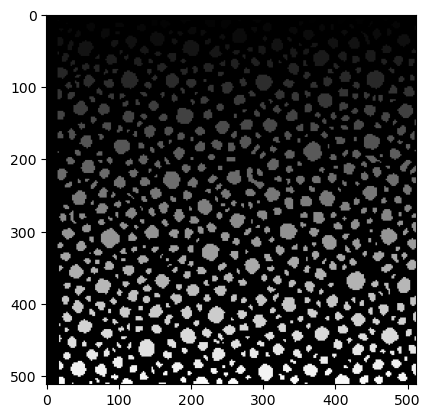

2828
98.1004243281471


In [26]:
import pandas as pd
import plotly
import plotly.express as px
import plotly.graph_objects as go
## For inner (blue) circles
## Convert image to what we want
GTSeg_blue = GTSegmented[:,:,0]

# Convert to binary as the label function requires it
GTSeg_blue[GTSeg_blue == 255] = 1

# Change so the background is 0 and the circles are 1
GTSeg_blue = np.logical_not(GTSeg_blue)

# Display yhe image
plt.imshow(GTSeg_blue[0:512, 0:512], cmap='gray')
plt.show()

# Label the segments
label_img, num_of_segs = label(GTSeg_blue, return_num=True, connectivity=2)

plt.imshow(label_img[0:512, 0:512], cmap='gray')

plt.show()

print(num_of_segs)

region_props = regionprops(label_img.astype(int))

region_areas = np.zeros((num_of_segs,1))

for idx,region in enumerate(region_props):
    region_areas[idx] = region.area
    
print(np.mean(region_areas))

# for prop in region_props:
#      print(prop, region_props[prop])




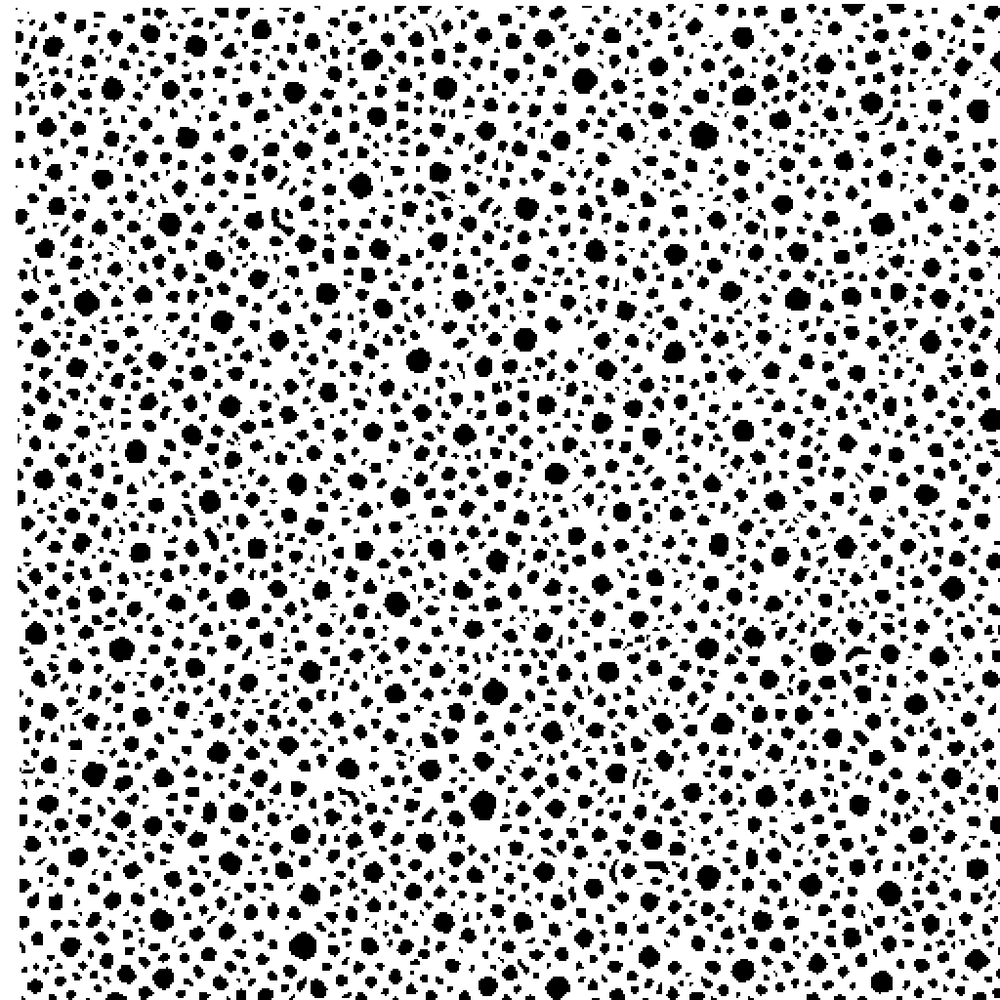

In [125]:
properties = ['area', 'eccentricity', 'perimeter', 'intensity_mean']

fig = px.imshow(GTSeg_blue, binary_string=True)
fig.update_traces(hoverinfo='skip') # hover is only for label info

# For each label, add a filled scatter trace for its contour,
# and display the properties of the label in the hover of this trace.
for index in range(1, label_img.max()):
    label_i = region_props[index].label
    contour = measure.find_contours(label_img == label_i, 0.5)[0]
    y, x = contour.T
    hoverinfo = ''
    for prop_name in properties:
        hoverinfo += f'<b>{prop_name}: {getattr(props[index], prop_name):.2f}</b><br>'
    fig.add_trace(go.Scatter(
        x=x, y=y, name=label_i,
        mode='lines', fill='toself', showlegend=False,
        hovertemplate=hoverinfo, hoveron='points+fills'))

plotly.io.show(fig)

In [64]:
# Program to count islands in boolean 2D matrix
class Graph:

	def __init__(self, row, col, g):
		self.ROW = row
		self.COL = col
		self.graph = g

	# A function to check if a given cell
	# (row, col) can be included in DFS
	def isSafe(self, i, j, visited):
		# row number is in range, column number
		# is in range and value is 1
		# and not yet visited
		return (i >= 0 and i < self.ROW and
				j >= 0 and j < self.COL and
				not visited[i][j] and self.graph[i][j])

	# A utility function to do DFS for a 2D
	# boolean matrix. It only considers
	# the 8 neighbours as adjacent vertices

	def DFS(self, i, j, visited):

		# These arrays are used to get row and
		# column numbers of 8 neighbours
		# of a given cell
		rowNbr = [-1, -1, -1, 0, 0, 1, 1, 1]
		colNbr = [-1, 0, 1, -1, 1, -1, 0, 1]

		# Mark this cell as visited
		visited[i][j] = True

		# Recur for all connected neighbours
		for k in range(8):
			if self.isSafe(i + rowNbr[k], j + colNbr[k], visited):
				self.DFS(i + rowNbr[k], j + colNbr[k], visited)

	# The main function that returns
	# count of islands in a given boolean
	# 2D matrix

	def countIslands(self):
		# Make a bool array to mark visited cells.
		# Initially all cells are unvisited
		visited = [[False for j in range(self.COL)]for i in range(self.ROW)]
		sizes = []

		# Initialize count as 0 and traverse
		# through the all cells of
		# given matrix
		count = 0
		for i in range(self.ROW):
			for j in range(self.COL):
				# If a cell with value 1 is not visited yet,
				# then new island found
				if visited[i][j] == False and self.graph[i][j] == 1:
					# Visit all cells in this island
					# and increment island count

					sizeBefore = sum(np.concatenate(visited).flat)

					self.DFS(i, j, visited)
					count += 1

					sizeAfter = sum(np.concatenate(visited).flat)
					sizes.append(sizeAfter - sizeBefore)
					

		return count, sizes


graph = [[1, 1, 0, 0, 0],
		[0, 1, 0, 0, 1],
		[1, 0, 0, 1, 1],
		[0, 0, 0, 0, 0],
		[1, 0, 1, 0, 1]]


row = len(graph)
col = len(graph[0])

g = Graph(row, col, graph)

print("Number of islands is:")
print(g.countIslands())


# This code is contributed by Neelam Yadav: https://www.geeksforgeeks.org/find-the-number-of-islands-using-dfs/
# But adapted to also calculate "island" size

# We can see that it workes on the example, but its very slow on big photos


Number of islands is:
(5, [4, 3, 1, 1, 1])


In [65]:
## results Radii distribution. proposal feel free to change it
import numpy as np

# ERIK: Dont really know what the best approach to this part is. There are functions that detects circles in images, but I dont think that the majosity of
# our "circles" are round enough. 

blueAndWhite = np.zeros((1024,1024))


for row in range(1024):
    for col in range(1024):
        if all(GTSegmented[row,col] == [0,0,255]):
            blueAndWhite[row,col] = 1

print(blueAndWhite)

g = Graph(1024,1024,blueAndWhite) # This code is very slow, I waited for around 10m without getting a result. But in theory it should work.
print(g.countIslands())

 
## Have not done anything under here

rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)


rads_gt = [ rads_inner ,rads_outer]
rads_test0 = [ rads_inner ,rads_outer]  # your result
rads_test1 = [ rads_inner ,rads_outer]  # your result

all_rads= [rads_gt , rads_test0 , rads_test1] 

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5)
    ax.legend()
    ax.set_title(nm)
plt.show()


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


KeyboardInterrupt: 

### 2.2 Low frequencies

In [ ]:

files = ["GT_3.png"  , "test_3_0.png" , "test_3_1.png"]
path = "data/"
gt_3 = np.array(Image.open(path_folder+ files[0]))
lowfreq0 = np.array(Image.open(path_folder+ files[1]))
lowfreq1 = np.array(Image.open(path_folder+ files[2]))

images = [gt_3 , lowfreq0, lowfreq1]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.hist(np.ravel(im), bins=255)
    ax.set_title(nm)
    ax.set_xlabel('Value')
    ax.set_ylabel('Count')
plt.show()

### 2.2.1 Preprocessing



### 2.2.2 Results Segmetations

In [ ]:
GT_3Segmented = np.zeros((1024,1024,3)) # New valuable for RGB image of GT (Can also change gt_0 if we want that instead)

# Changing the pixels with different intensity to red blue and white
GT_3Segmented[gt_0==30] = np.array([255,0,0])
GT_3Segmented[gt_0==150] = np.array([0,0,255])
GT_3Segmented[gt_0==230] = np.array([255,255,255])
GT_3Segmented=GT_3Segmented.astype('uint8') # Got some error when I plotted, this fixed it



#images = [gt_3 , lowfreq0, lowfreq1]
images = [GT_3Segmented , lowfreq0, lowfreq1]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512], cmap='gray')
    ax.axis('off')
    ax.set_title(nm)
plt.show()


### 2.2.3 Radii histrograms

### 2.5 Not mandatory exercise, Real data ( 3 points )

The points are given just by having a good enough segmentation.

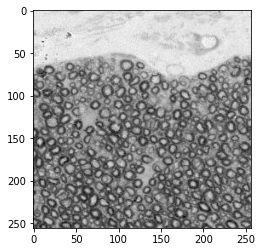

In [18]:
# Add your implementation and discussion
import cv2

files = ["extra_point.png" ]
real_data = cv2.imread(path_folder+ files[0])

plt.imshow(real_data[:256, :256])